# Los `missing` de cada clase, a ojo

Un `missing` es una predicción confiada del modelo fuera de muestra (los cinco pliegues de
`yolo26s_v3`, `src/kfold.py`) sin ninguna anotación debajo (`src/find_issues.py`). Interesan los
que además no tienen ninguna fila en la tabla cruda de `data/unified/` (`raw_estado = sin fila`):
o son llamadas sin anotar, o son falsos positivos del modelo.

Por cada clase, una figura de dos columnas. Arriba a la izquierda, tres ventanas de train con un
`missing` de la clase (celeste punteado, con su score; si la ventana tiene varios se dibujan
todos). En el resto, siete ventanas con una anotación real de la clase (verde). Si los tres se
parecen a los siete, son llamadas sin anotar; si no, falsos positivos.

Lee `runs/yolo26s_v3_kfold5/hallazgos_train.csv` y el caché de train (`data/processed/`).

In [1]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import pandas as pd

ROOT = next(p for p in [Path.cwd(), *Path.cwd().parents] if (p / "src").is_dir())
sys.path.insert(0, str(ROOT / "src"))

from analysis.figures import HIGHLIGHT_COLOR, draw_box, draw_window, jpeg_figures, panel_grid
from analysis.windows import Split
from core.config import RUNS_DIR, SEED, P
from data import cache
from data.raven import CLEANED_BOX_COLUMNS
from find_issues import (
    ISSUE,
    LABEL_COLUMN,
    MISSING,
    NO_ROW,
    RAW_STATE,
    RECORDING,
    SCORE,
    STATES,
    WINDOW,
    WINDOW_START,
)
from utils.audio import hz_to_y

KFOLD = "yolo26s_v3_kfold5"
N_MISSING, N_REFERENCES = 3, 7
BEGIN, END, LOW, HIGH = CLEANED_BOX_COLUMNS
jpeg_figures()
pd.set_option("display.width", 160)

## Cuántos `missing` hay por clase y qué había debajo

`anotadas`: cajas de la clase en train. Las demás columnas son los `missing` según lo que había en
la tabla cruda debajo de la predicción (`raw_estado`).

In [2]:
train = Split(cache.TRAIN)
findings = pd.read_csv(RUNS_DIR / KFOLD / "hallazgos_train.csv")
missing = findings[findings[ISSUE] == MISSING]

n_annotated = pd.Series({name: len(train.boxes_of(c)) for c, name in enumerate(train.names)})
by_state = pd.crosstab(missing[LABEL_COLUMN], missing[RAW_STATE]).reindex(
    columns=STATES, fill_value=0
)
by_state.insert(0, "anotadas", n_annotated)
by_state.sort_values(NO_ROW, ascending=False)

raw_estado,anotadas,sin fila,descartada,en revisión,sin clase,limpia
species,,,,,,
sb/ppc,1340,331,1,0,0,16
sb/spc,859,245,0,0,1,4
lw/trino,739,167,0,0,4,11
sm/cc,2353,158,5,0,0,1
as/hc,6933,140,25,0,0,5
as/bc,2216,119,3,0,0,32
lw/cs,2667,88,1,0,1,18
sm/fs,799,85,0,0,3,14
ac/bc,2838,84,4,0,1,52


## Los `missing` sin fila cruda, dibujados

Se quedan sólo los `sin fila`, de mayor a menor score, con su banda pasada a filas del mel.

1961 missing sin fila cruda en 561 grabaciones


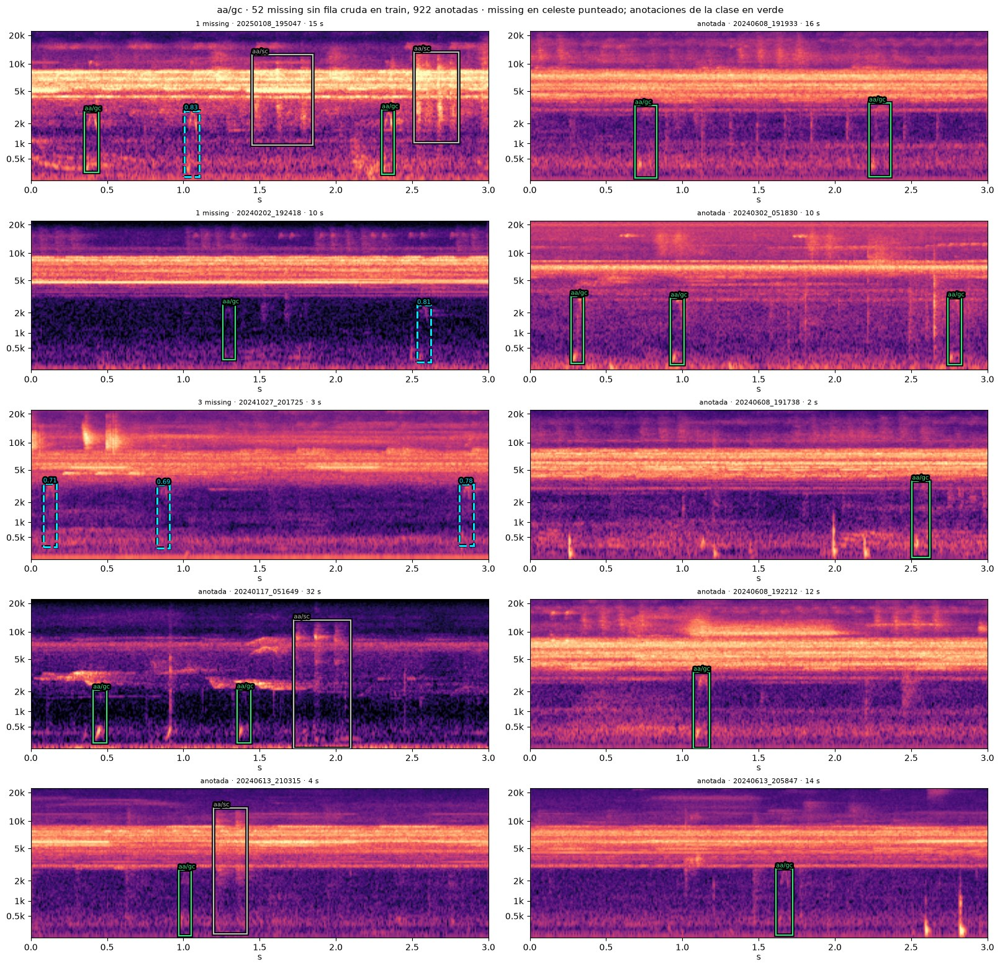

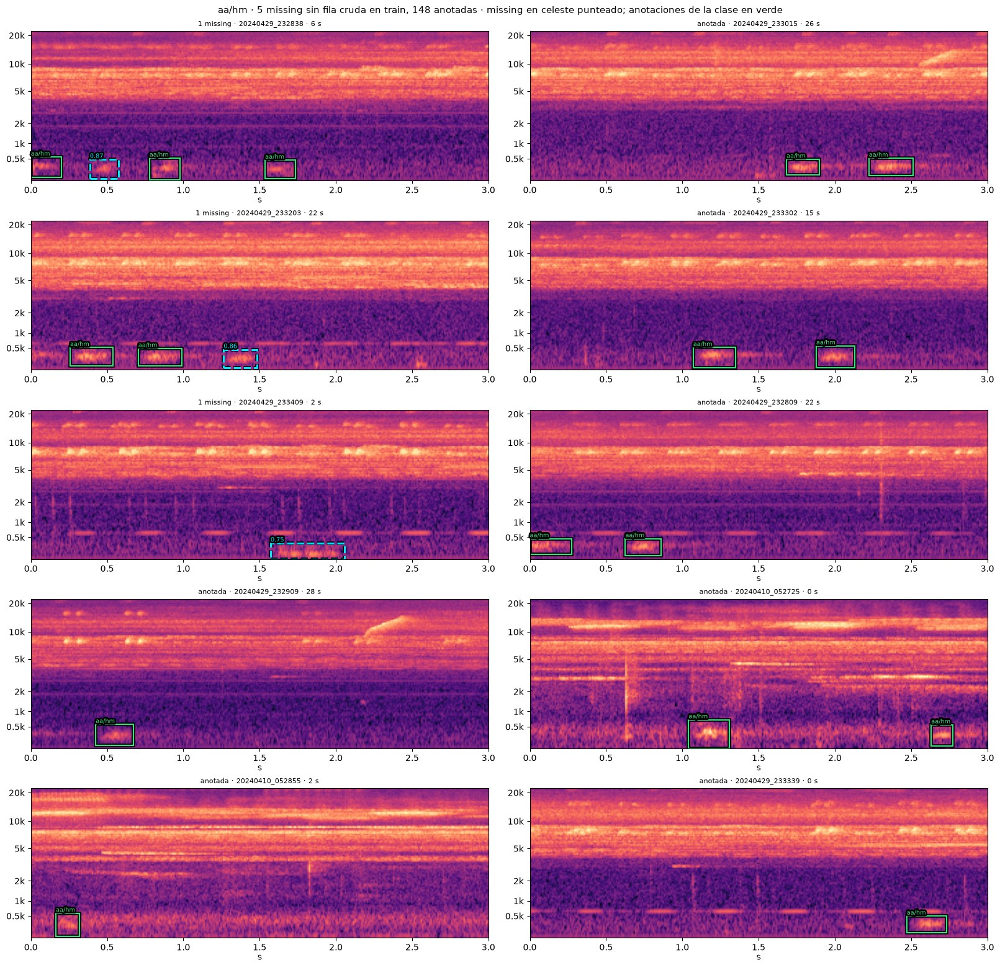

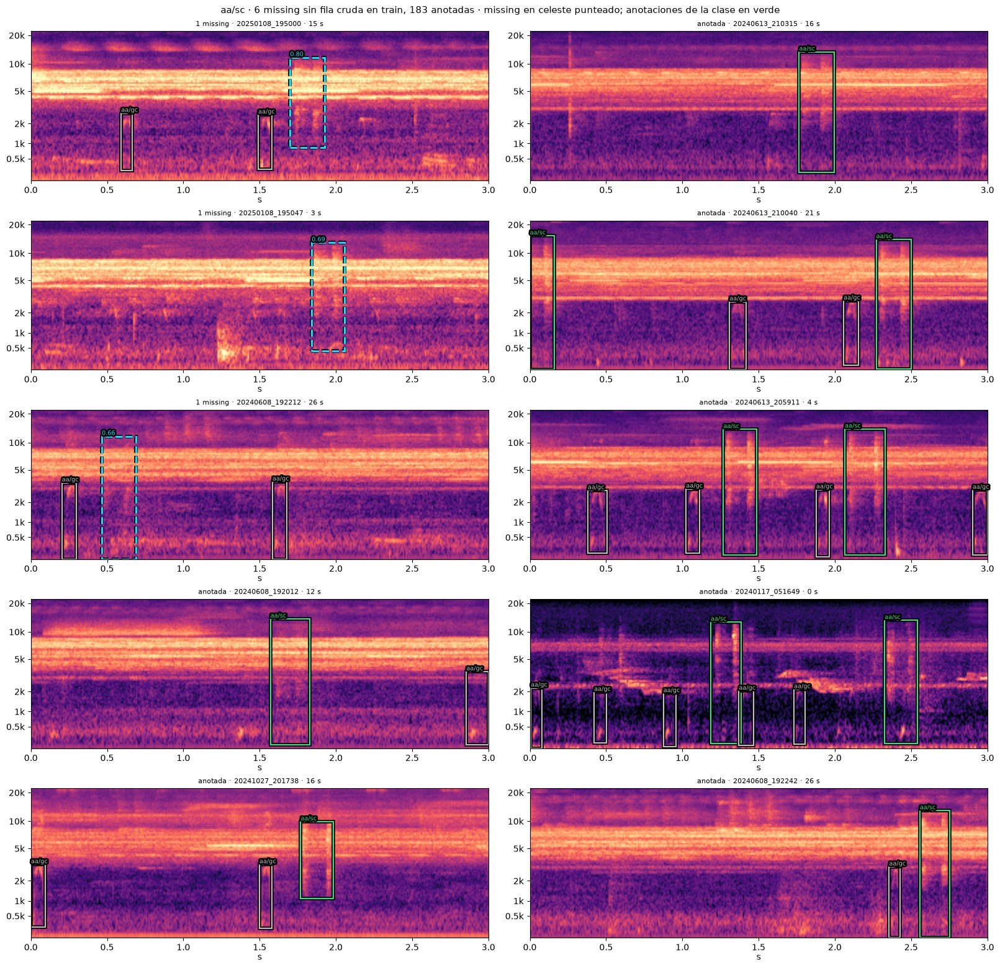

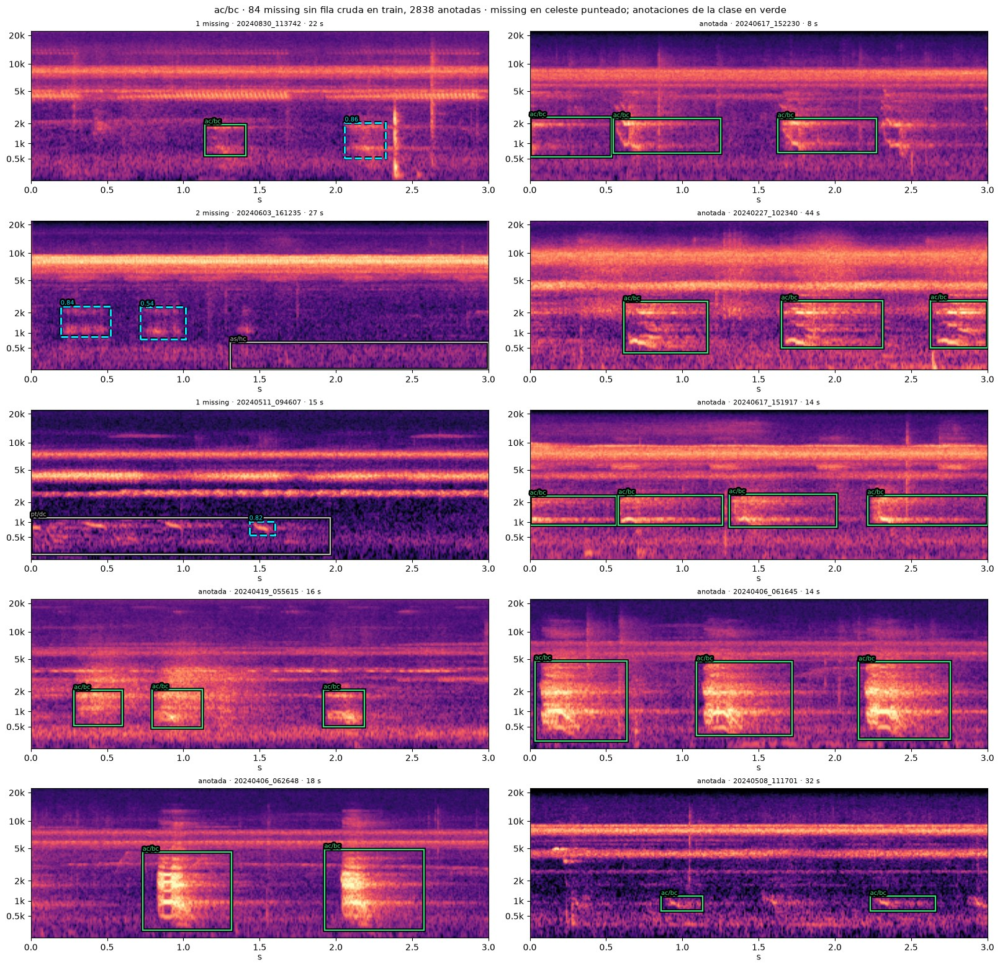

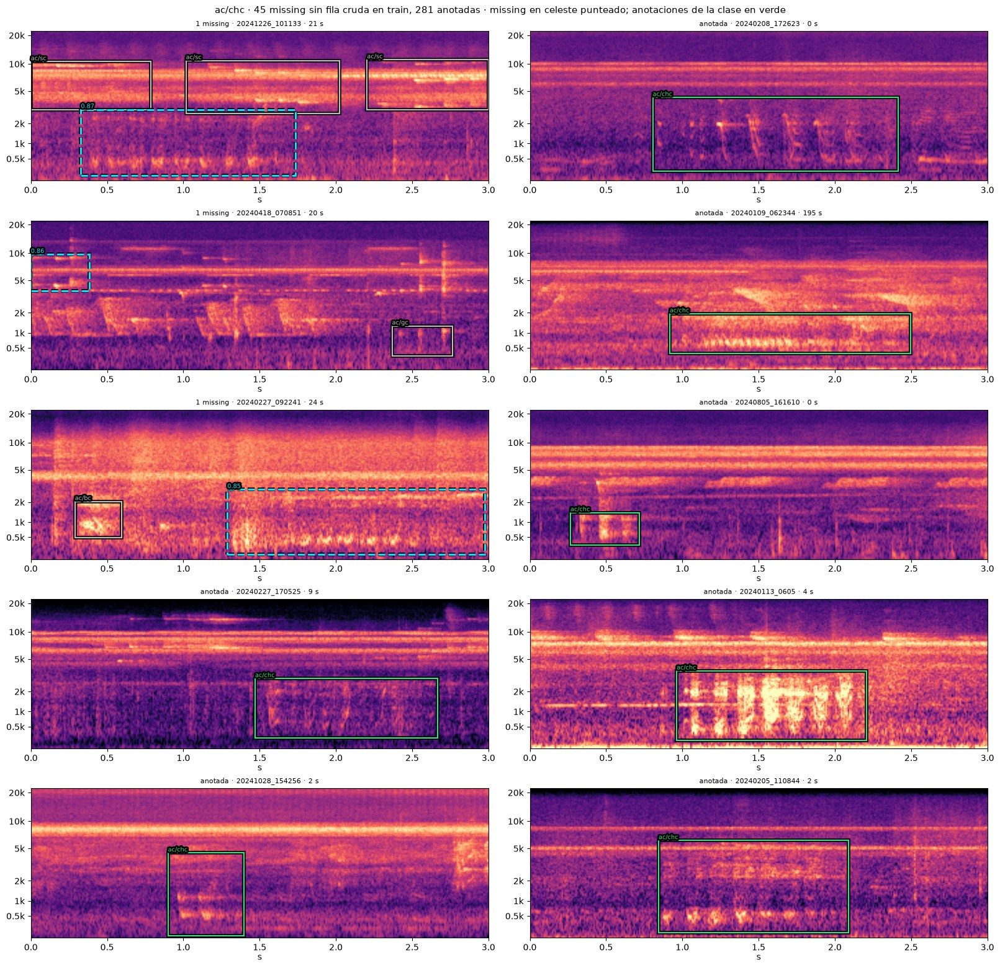

...

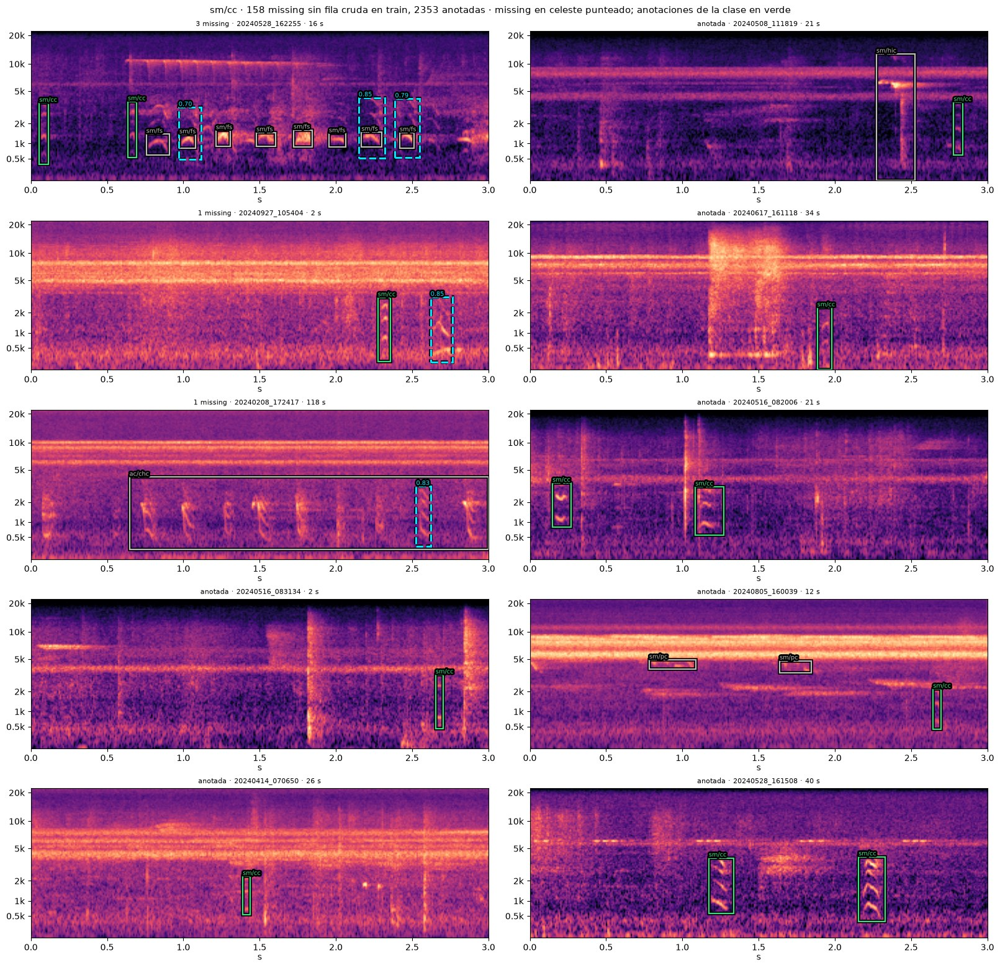

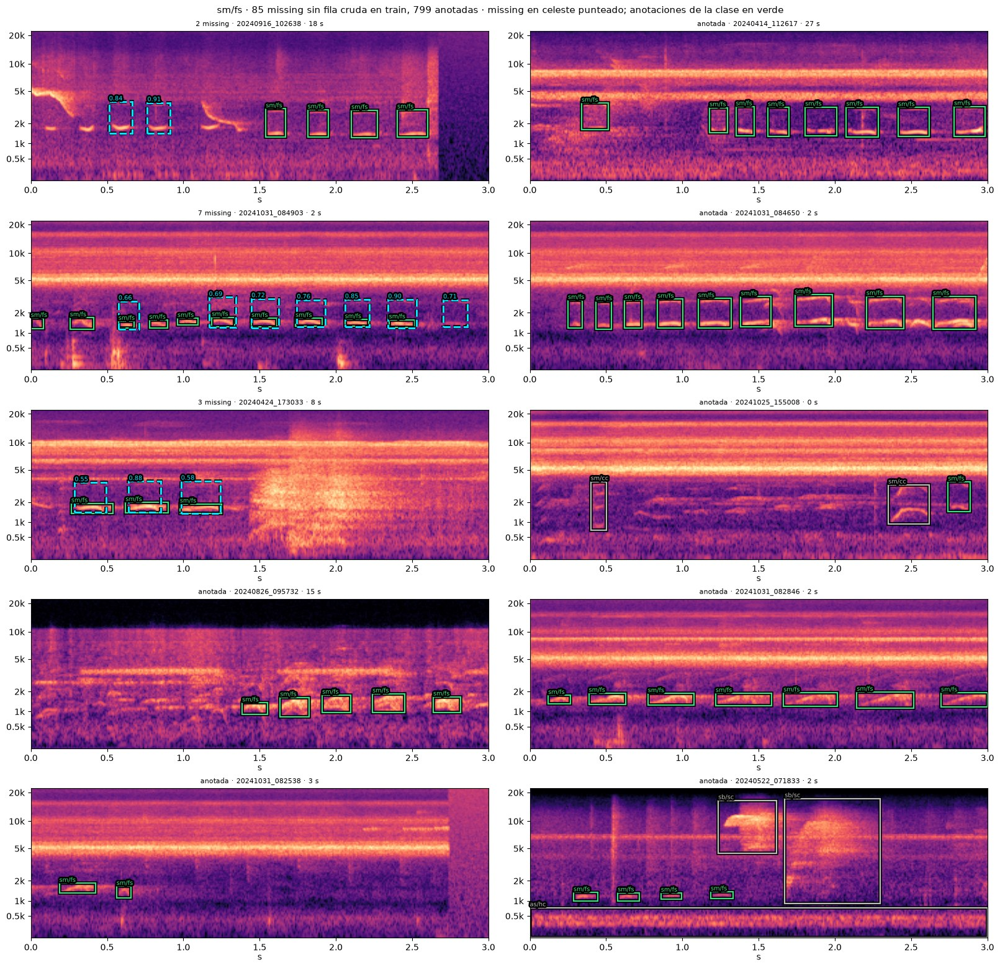

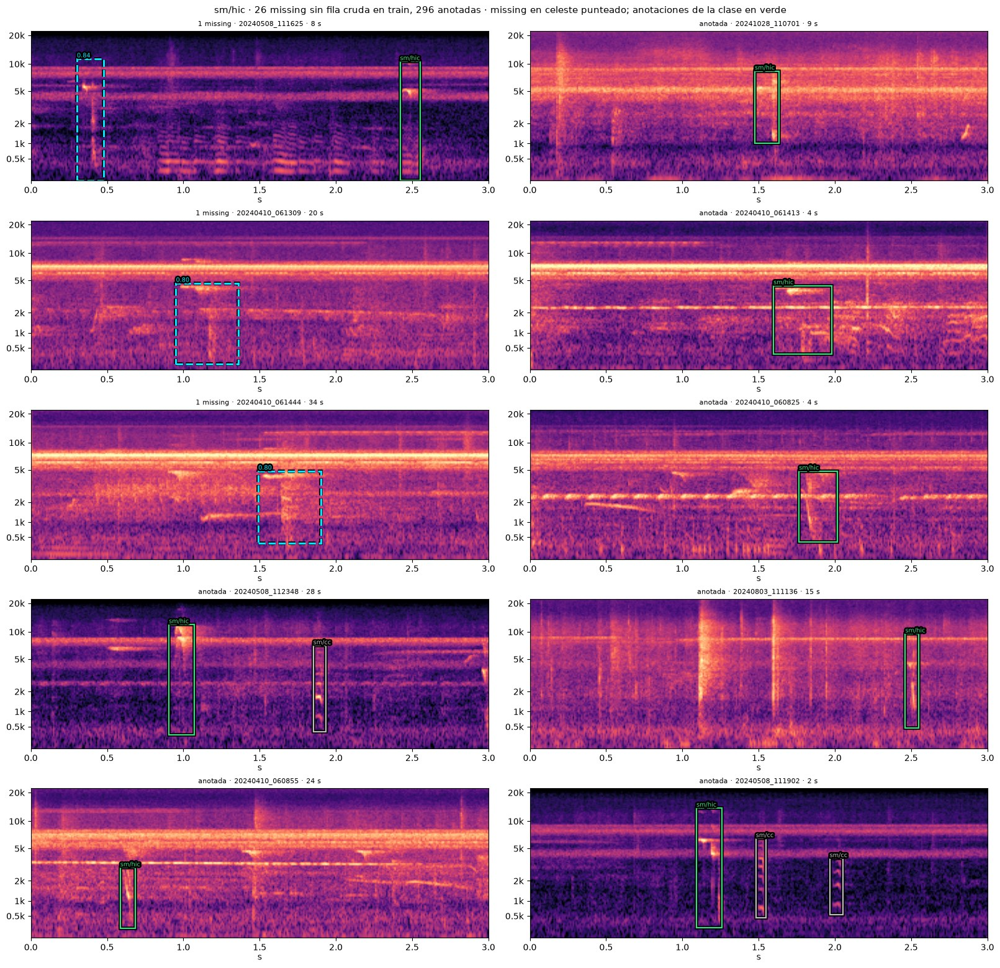

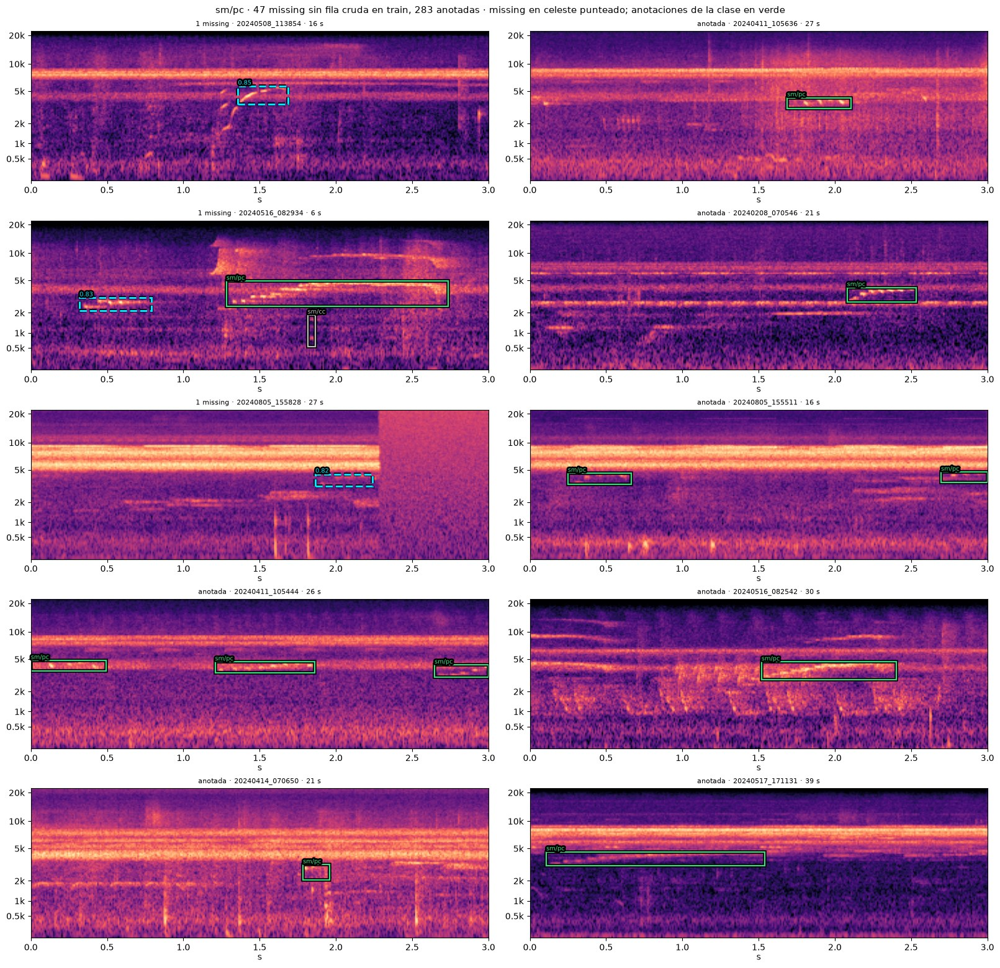

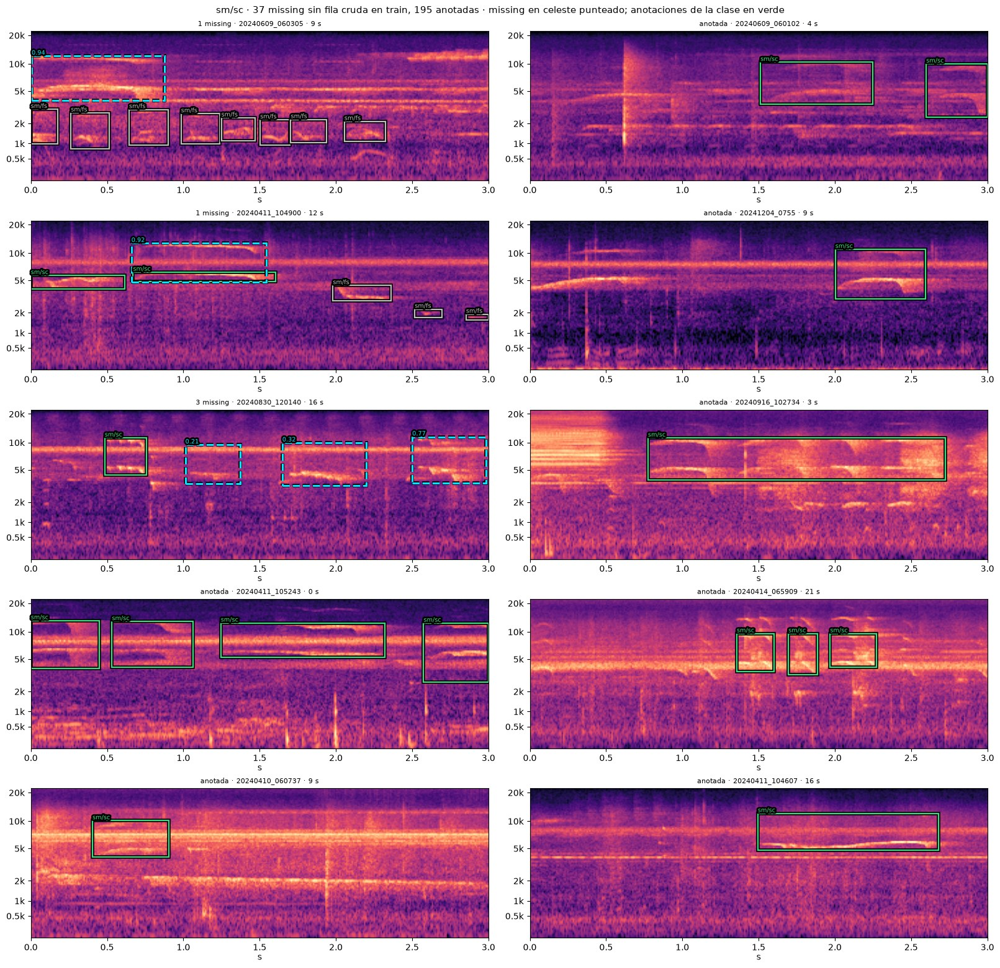

In [3]:
missing = missing[missing[RAW_STATE] == NO_ROW].sort_values(SCORE, ascending=False).copy()
missing["y0"], missing["y1"] = (
    hz_to_y(missing[LOW].to_numpy(), P),
    hz_to_y(missing[HIGH].to_numpy(), P),
)
print(f"{len(missing)} missing sin fila cruda en {missing[RECORDING].nunique()} grabaciones")


def draw_missing(ax, row: pd.Series, class_id: int) -> None:
    # La ventana del missing con todos los de su clase que caen al menos a medias en ella
    image_id, start = int(row[WINDOW]), float(row[WINDOW_START])
    of_class = missing[
        (missing[RECORDING] == row[RECORDING]) & (missing[LABEL_COLUMN] == train.names[class_id])
    ]
    visible = of_class[END].clip(upper=start + P.clip_len_s) - of_class[BEGIN].clip(lower=start)
    in_window = of_class[visible >= 0.5 * (of_class[END] - of_class[BEGIN])]
    title = f"{len(in_window)} missing · {train.recording_of(image_id)} · {start:.0f} s"
    draw_window(ax, train, image_id, class_id, title)
    for _, m in in_window.iterrows():
        x0, x1 = max(float(m[BEGIN]) - start, 0.0), min(float(m[END]) - start, P.clip_len_s)
        draw_box(
            ax,
            x0,
            x1,
            float(m["y0"]),
            float(m["y1"]),
            HIGHLIGHT_COLOR,
            f"{m[SCORE]:.2f}",
            dashed=True,
        )


for class_id, name in enumerate(train.names):
    shown = missing[missing[LABEL_COLUMN] == name].drop_duplicates(RECORDING).head(N_MISSING)
    if shown.empty:
        print(f"{name}: sin missing")
        continue
    exclude = {train.recording_of(int(w)) for w in shown[WINDOW]}
    references = train.examples(class_id, N_REFERENCES, SEED + class_id, exclude)
    fig, axes = panel_grid((N_MISSING + N_REFERENCES + 1) // 2, 2)
    for ax, (_, row) in zip(axes[:N_MISSING, 0], shown.iterrows()):
        draw_missing(ax, row, class_id)
    # Las referencias llenan la columna derecha y después las filas que quedan a la izquierda
    slots = [*axes[:N_MISSING, 1], *axes[N_MISSING:].flat]
    for ax, image_id in zip(slots, references):
        title = f"anotada · {train.recording_of(image_id)} · {train.start_of(image_id):.0f} s"
        draw_window(ax, train, image_id, class_id, title)
    fig.suptitle(
        f"{name} · {(missing[LABEL_COLUMN] == name).sum()} missing sin fila cruda en train, "
        f"{n_annotated[name]} anotadas · missing en celeste punteado; anotaciones de la clase en verde",
        fontsize=11,
    )
    plt.show()